### SETUP

Import necessary libraries:

In [ ]:
import numpy as np, matplotlib.pyplot as plt, librosa, librosa.display, urllib, IPython.display as ipd, soundfile as sf
import scipy.spatial
from scipy.cluster import hierarchy

Set parameters:

In [ ]:
### PARAMETERS
N_MFCC = 13 # number of MFCC coeficcients
FRAME_LENGTH = N_FFT = 2**10 # calculations can get quite slow with small values (ie. below 2**11=2048), noisy too, if not windowed!
ZERO_FEATURE = False # do not include 0th MFCC feature which represents loudness
ONSET_DETECTION = True # onset detection mode
WINDOWING = True # frame windowing (window applied before MFCC calculation)
WINDOW_BETA = 3 # beta coefficient of the kaiser window

if ONSET_DETECTION:
    HOP_LENGTH = 2**11 # not more than 2**11, onset detection returns an empty array otherwise
else:
    HOP_LENGTH = FRAME_LENGTH

Load an audio file:

In [ ]:
if 'google.colab' in str(get_ipython()):
    print('Running on Colab')
    from google.colab import files

    uploaded = files.upload()

    for fn in uploaded.keys():
        print('User uploaded file "{name}" with length {length} bytes'.format(
            name=fn, length=len(uploaded[fn])))
        file = fn
else:
    print('Not running on Colab')
    from ipyfilechooser import FileChooser

    # Create and display a FileChooser widget
    fc = FileChooser('.')
    # Set a file filter patern
    fc.filter_pattern = ['*.wav', '*.mp3', '*.flac']
    display(fc)

Not running on Colab


FileChooser(path='/Users/wwerkowicz/GitHub/audioSlicer', filename='', title='', show_hidden=False, select_desc…

In [ ]:
if not 'google.colab' in str(get_ipython()):
    file = fc.selected
print(file)

/Users/wwerkowicz/Downloads/Bound Unto Root - Afterword.mp3


/Users/wwerkowicz/opt/anaconda3/envs/audioSlicer/lib/python3.10/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


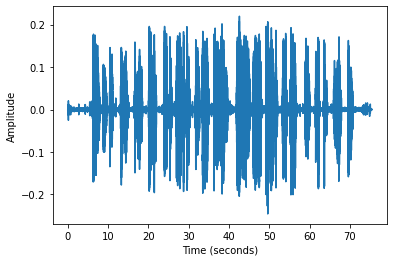

In [ ]:
y, sr = librosa.load(file)

t = np.arange(0, len(y)/sr, 1/sr)

plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.plot(t, y)

ipd.Audio(y, rate=sr)

We can add a shorthand for analyzing a segment with no windowing:

In [ ]:
def mfcc(y):
    length = len(y)
    return librosa.feature.mfcc(y=y, sr=sr, hop_length=length, n_mfcc=N_MFCC, center=False, n_fft=N_FFT)

Then, we can use it to implement basic sliding window mfcc analysis:

In [ ]:
def applyWindow(frames, window_beta, onset_detection):
    w_frames = []
    if onset_detection:
        for frame in frames:
            window = np.kaiser(len(frame), window_beta) # calculate window to use each time, frames have different lengths!
            w_frames.append(frame * window)
    else:
        window = np.kaiser(len(frames[0]), window_beta) # window to use
        w_frames = frames * window
    return w_frames

In [ ]:
def slideMFCC(frames, zero_feature):
    if not zero_feature:
        dim = N_MFCC-1
    else:
        dim = N_MFCC

    results = np.empty((1, dim, 1))
    for frame in frames:
        next_result = mfcc(frame)
        if not zero_feature:
            next_result = next_result[1:len(next_result)] # 0th feature can be enabled to take loudness into account
        results = np.concatenate([results, [next_result]])

    results = results.squeeze(2)
    # results = np.transpose(results)
    print(results.shape)

    return results

In [ ]:
def displayMFCCS(mfccs, zero_feature):
    if not zero_feature:
        mfcc_i = np.arange(1, N_MFCC)
        ypos = np.arange(0, N_MFCC-1)
    else:
        mfcc_i = np.arange(0, N_MFCC)
        ypos = np.arange(0, N_MFCC)

    plt.yticks(ypos, mfcc_i)
    plt.ylabel('MFCC Coefficient Index')
    plt.xlabel('Frame Index')
    return plt.imshow(mfccs.T, origin='lower', aspect='auto', interpolation='nearest')

We will segment the audio file, window and calculate MFCCs for each frame:

In [ ]:
### TODO: onset segmentation
if ONSET_DETECTION:
    onset_frames = librosa.onset.onset_detect(y, sr=sr, hop_length=HOP_LENGTH, backtrack=True)
    onset_times = librosa.frames_to_time(onset_frames, sr=sr, hop_length=HOP_LENGTH)
    onset_samples = librosa.frames_to_samples(onset_frames, hop_length=HOP_LENGTH)
    frames = []
    for i in range(0, len(onset_samples)):
        start = onset_samples[i]
        if i + 1 < len(onset_samples):
            end = onset_samples[i + 1]
        else:
            end = len(y)-1
        frame = (y[start:end])
        if len(frame) > 0:
            frames.append(frame)
else:
    frames = librosa.util.frame(y, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).T

/var/folders/kt/3yzrdbd548lfc1w4yd4phlwm0000gn/T/ipykernel_81253/3271244899.py:3: FutureWarning: Pass y=[0. 0. 0. ... 0. 0. 0.] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  onset_frames = librosa.onset.onset_detect(y, sr=sr, hop_length=HOP_LENGTH, backtrack=True)


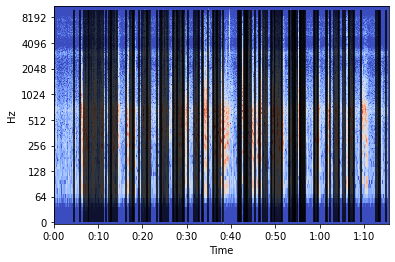

In [ ]:
if ONSET_DETECTION:
    S = librosa.stft(y)
    logS = librosa.amplitude_to_db(np.abs(S))
    librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='log')
    plt.vlines(onset_times, 0, 10000, color='k')
else:
    slice_samples = []
    for i in range(len(frames[0]), len(frames) * len(frames[0]), len(frames[0])):
        slice_samples.append(i)
    np.array(slice_samples)
    slice_times = np.true_divide(slice_samples, sr)
    slice_times
    S = librosa.stft(y)
    logS = librosa.amplitude_to_db(np.abs(S))
    librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='log')
    plt.vlines(slice_times, 10000, 0, color='k')

(127, 12)


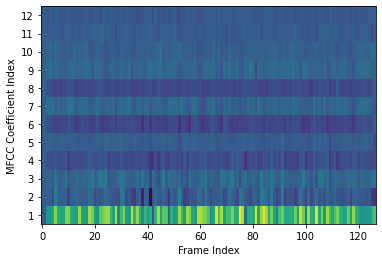

In [ ]:
if WINDOWING:
    frames = applyWindow(frames=frames, window_beta=WINDOW_BETA, onset_detection=ONSET_DETECTION)
mfccs = slideMFCC(frames=frames, zero_feature=ZERO_FEATURE)
displayMFCCS(mfccs=mfccs, zero_feature=ZERO_FEATURE)

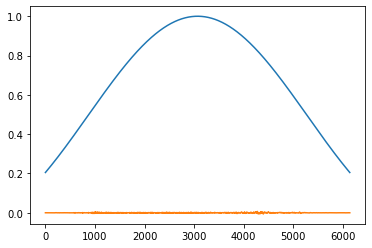

In [ ]:
if WINDOWING:
    middle = int(len(frames)/2)
    if ONSET_DETECTION:
        window = np.kaiser(len(frames[middle]), WINDOW_BETA) # calculate window to use each time, frames have different lengths!
    plt.plot(window)
    plt.plot(frames[middle])

### Nearest neighbours

We can build a k-d tree using the MFCCs of each frame.
Querying an ordered list of nearest neighbours of any frame is pretty efficient this way:

In [ ]:
kdtree = scipy.spatial.cKDTree(mfccs[0:len(mfccs)-1], leafsize=16, compact_nodes=True, copy_data=False, balanced_tree=False, boxsize=None)
neighbours = kdtree.query(mfccs[0], len(mfccs)-1)
neighbours

(array([  0.        ,   0.        ,  77.79059216,  85.40347224,
         87.95187652,  88.4925183 ,  90.3568688 ,  97.81744201,
         98.66009504,  99.68836269, 101.2618412 , 101.47117703,
        102.97874271, 106.45979798, 106.65955675, 106.65969276,
        107.99322145, 108.79756121, 109.5130825 , 109.97785965,
        110.64721291, 111.46804532, 111.94970023, 113.78639497,
        114.2555289 , 116.53740084, 118.05294818, 118.59723841,
        118.94195582, 119.6028392 , 122.7332534 , 122.86281596,
        122.86580316, 122.93915916, 123.5516819 , 123.63615262,
        123.91803671, 124.34152574, 124.69091559, 124.94356466,
        125.02205408, 125.47204292, 125.86762316, 126.57555592,
        126.63195699, 126.81797582, 126.9797854 , 129.85202827,
        130.87292206, 131.12438474, 131.97306469, 133.08412192,
        134.28570276, 135.3178639 , 135.4957278 , 135.57408414,
        135.62627966, 135.93665484, 137.11080772, 138.65197766,
        138.66479259, 141.91011362, 142.

Now it is fairly straightforward to rearrange the frames according to their distance from frame[0]:

In [ ]:
output = []

for neighbour in neighbours[1]:
    output = np.concatenate([output, frames[neighbour]])

ipd.Audio(output, rate=sr)

Let's see how the MFCC of the output looks like:

(813, 12)


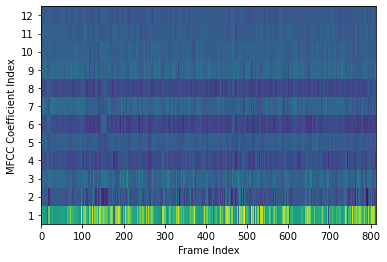

In [ ]:
frames_0 = librosa.util.frame(output, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).T
if WINDOWING:
    frames_0 = applyWindow(frames=frames_0, window_beta=WINDOW_BETA, onset_detection=ONSET_DETECTION)
mfccs_0 = slideMFCC(frames=frames_0, zero_feature=ZERO_FEATURE)
displayMFCCS(mfccs=mfccs_0, zero_feature=ZERO_FEATURE)

### Shortest path

Another option is to always look for the next closest neighbour from the current frame so the result sounds shifts more smoothly.
To not end up in an infinite loop, we have to make sure each point is visited only once:

In [ ]:
kdtree = scipy.spatial.cKDTree(mfccs[0:len(mfccs)-1], leafsize=16, compact_nodes=True, copy_data=False, balanced_tree=True, boxsize=None)
neighbours = kdtree.query(mfccs[0], 2)
route = neighbours[1]
route

array([1, 0])

In [ ]:
while len(route) < len(frames):
    k = 2
    last = len(route) - 1
    current = mfccs[route[last]]
    next = kdtree.query(current, k)[1]
    while next[-1] in route:
        k += 1
        next = kdtree.query(current, k)[1]
    route = np.append(route, next[-1])

# route

In [ ]:
output = []

for i in range(len(frames)):
    next = route[i]
    output = np.concatenate([output, frames[next]])

ipd.Audio(output, rate=sr)

We can have a look at the MFCCs which should be more continuous than in the previous case:

(813, 12)


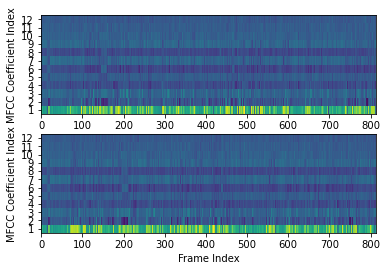

In [ ]:
frames_1 = librosa.util.frame(output, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).T
if WINDOWING:
    frames_1 = applyWindow(frames=frames_1, window_beta=WINDOW_BETA, onset_detection=ONSET_DETECTION)
mfccs_1 = slideMFCC(frames=frames_1, zero_feature=ZERO_FEATURE)

plt.subplot(2, 1, 1)
displayMFCCS(mfccs=mfccs_0, zero_feature=ZERO_FEATURE)
plt.subplot(2, 1, 2)
displayMFCCS(mfccs=mfccs_1, zero_feature=ZERO_FEATURE)

### Cluster Hierarchy Dendrogram

Instead of using a k-d tree we can also cluster the frames and represent the cluster hierarchy with a dendrogram:

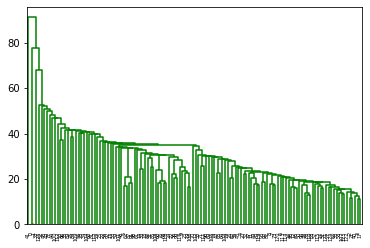

In [ ]:
# Plot the cluster as a dendrogram.
mfccs = mfccs[0:len(mfccs)-1]
temp = hierarchy.linkage(mfccs, 'single')
plt.figure()

dn = hierarchy.dendrogram(
    temp, above_threshold_color="green", color_threshold=.7, count_sort=True)

leaves = dn.get('leaves')

In [ ]:
output = []

for leaf in leaves:
    output = np.concatenate([output, frames[leaf]])
ipd.Audio(output, rate=sr)

(813, 12)


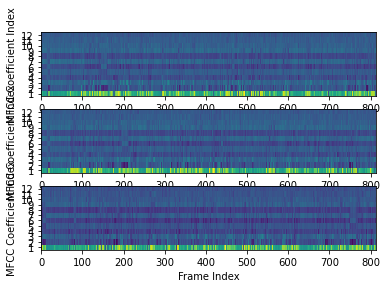

In [ ]:
frames_3 = librosa.util.frame(output, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).T
if WINDOWING:
    frames_3 = applyWindow(frames=frames_3, window_beta=WINDOW_BETA, onset_detection=ONSET_DETECTION)
mfccs_3 = slideMFCC(frames=frames_3, zero_feature=ZERO_FEATURE)

plt.subplot(3, 1, 1)
displayMFCCS(mfccs=mfccs_0, zero_feature=ZERO_FEATURE)
plt.subplot(3, 1, 2)
displayMFCCS(mfccs=mfccs_1, zero_feature=ZERO_FEATURE)
plt.subplot(3, 1, 3)
displayMFCCS(mfccs=mfccs_3, zero_feature=ZERO_FEATURE)

At last, we can also save the output into a file:

In [ ]:
# file_out = str(FRAME_LENGTH) + "_" + file + ".wav"
# sf.write(str(file_out), output, sr)